In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import h5py
import plotly.express as px

# ISIC 2024 Challenge Dataset

In [ ]:
# Download the dataset from Kaggle
!kaggle competitions download -c isic-2024-challenge -p ../data/isic2024

In [4]:
# Unzip the dataset
import zipfile
with zipfile.ZipFile('../data/isic2024/isic-2024-challenge.zip', 'r') as zip_ref:
    zip_ref.extractall('../data/isic2024/')

In [4]:
# Read train metadata csv
train_metadata = pd.read_csv('../data/isic2024/train-metadata.csv')
train_metadata.head()

C:\Users\giova\AppData\Local\Temp\ipykernel_35116\1853342184.py:2: DtypeWarning: Columns (51,52) have mixed types. Specify dtype option on import or set low_memory=False.
  train_metadata = pd.read_csv('../data/isic2024/train-metadata.csv')


,isic_id,target,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,image_type,tbp_tile_type,tbp_lv_A,...,lesion_id,iddx_full,iddx_1,iddx_2,iddx_3,iddx_4,iddx_5,mel_mitotic_index,mel_thick_mm,tbp_lv_dnn_lesion_confidence
0,ISIC_0015670,0,IP_1235828,60.0,male,lower extremity,3.04,TBP tile: close-up,3D: white,20.244422,...,NaN,Benign,Benign,NaN,NaN,NaN,NaN,NaN,NaN,97.517282
1,ISIC_0015845,0,IP_8170065,60.0,male,head/neck,1.10,TBP tile: close-up,3D: white,31.712570,...,IL_6727506,Benign,Benign,NaN,NaN,NaN,NaN,NaN,NaN,3.141455
2,ISIC_0015864,0,IP_6724798,60.0,male,posterior torso,3.40,TBP tile: close-up,3D: XP,22.575830,...,NaN,Benign,Benign,NaN,NaN,NaN,NaN,NaN,NaN,99.804040
3,ISIC_0015902,0,IP_4111386,65.0,male,anterior torso,3.22,TBP tile: close-up,3D: XP,14.242329,...,NaN,Benign,Benign,NaN,NaN,NaN,NaN,NaN,NaN,99.989998
4,ISIC_0024200,0,IP_8313778,55.0,male,anterior torso,2.73,TBP tile: close-up,3D: white,24.725520,...,NaN,Benign,Benign,NaN,NaN,NaN,NaN,NaN,NaN,70.442510


### ISIC 2024 Dataset Exploration

In [12]:
# Target distribution
target_counts = train_metadata['target'].value_counts()
fig = px.pie(target_counts, values=target_counts.values, names=['Benign', 'Malignant'], title='Target Distribution in ISIC 2024')
fig.show()

In [13]:
# Anatomical site distribution
fig = px.histogram(train_metadata, x='anatom_site_general', title='Anatomical Site Distribution in ISIC 2024')
fig.show()

In [14]:
# Images per patient
images_per_patient = train_metadata['patient_id'].value_counts()
fig = px.histogram(x=images_per_patient.values, title='Images per Patient in ISIC 2024')
fig.update_layout(xaxis_title="Number of Images per Patient", yaxis_title="Number of Patients")
fig.show()

### Image Visualization for a Patient with Many Images

Here we visualize a sample of benign and malignant images from a patient who has a large number of images in the dataset. This helps to understand the intra-patient variation of skin lesions.

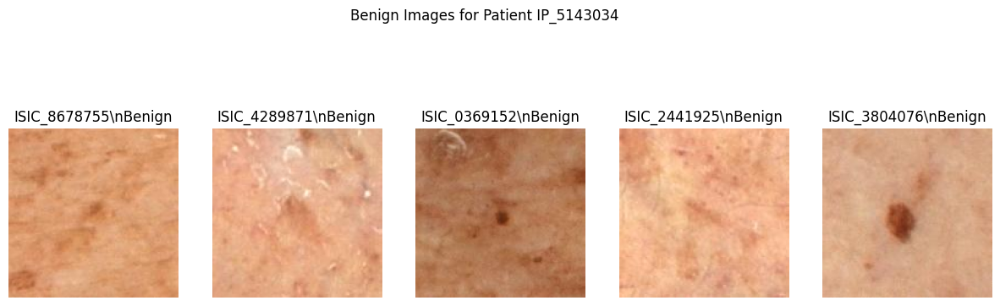

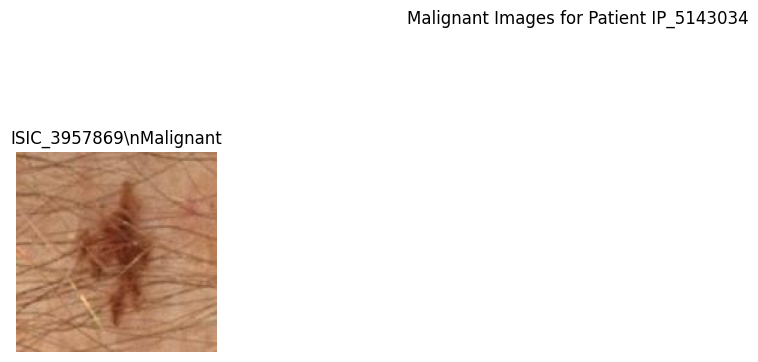

In [23]:
# Find patients with more than 2000 images
images_per_patient = train_metadata['patient_id'].value_counts()
patients_with_many_images = images_per_patient[images_per_patient > 2000]

if not patients_with_many_images.empty:
    # Select one patient
    patient_id = patients_with_many_images.index[7]

    # Get images for this patient
    patient_images = train_metadata[train_metadata['patient_id'] == patient_id]

    # Separate into benign and malignant
    benign_images = patient_images[patient_images['target'] == 0]
    malignant_images = patient_images[patient_images['target'] == 1]

    # Select a sample of images
    benign_sample_ids = benign_images['isic_id'].sample(min(5, len(benign_images)))
    malignant_sample_ids = malignant_images['isic_id'].sample(min(5, len(malignant_images)))

    # Display images
    # Benign
    if not benign_sample_ids.empty:
        plt.figure(figsize=(15, 5))
        for i, isic_id in enumerate(benign_sample_ids):
            image_path = f'../data/isic2024/train-image/image/{isic_id}.jpg'
            try:
                image = plt.imread(image_path)
                plt.subplot(1, 5, i + 1)
                plt.imshow(image)
                plt.title(f"{isic_id}\\nBenign")
                plt.axis('off')
            except FileNotFoundError:
                print(f"Image not found: {image_path}")
        plt.suptitle(f'Benign Images for Patient {patient_id}')
        plt.show()

    # Malignant
    if not malignant_sample_ids.empty:
        plt.figure(figsize=(15, 5))
        for i, isic_id in enumerate(malignant_sample_ids):
            image_path = f'../data/isic2024/train-image/image/{isic_id}.jpg'
            try:
                image = plt.imread(image_path)
                plt.subplot(1, 5, i + 1)
                plt.imshow(image)
                plt.title(f"{isic_id}\\nMalignant")
                plt.axis('off')
            except FileNotFoundError:
                print(f"Image not found: {image_path}")
        plt.suptitle(f'Malignant Images for Patient {patient_id}')
        plt.show()
else:
    print("No patients found with more than 2000 images.")

## ISIC 2019 Dataset

Contains 25,331 images available for the classification of dermoscopic images among nine different diagnostic categories:
- Melanoma
- Melanocytic nevus
- Basal cell carcinoma
- Actinic keratosis
- Benign keratosis (solar lentigo / seborrheic keratosis / lichen planus-like keratosis)
- Dermatofibroma
- Vascular lesion
- Squamous cell carcinoma
- None of the above

**SIZE:** 9.8 GB


In [ ]:
# Download the dataset from Kaggle
!kaggle datasets download -d andrewmvd/isic-2019 -p ../data/isic2019

### Dataset exploration

We have two csv files:
- `ISIC_2019_Training_GroundTruth.csv`: contains the labels for each image
- `ISIC_2019_Training_Metadata.csv`: contains metadata for each image (age, anatomical site, lesion_id, sex)

In [5]:
ground_truth = pd.read_csv('../data/isic2019/ISIC_2019_Training_GroundTruth.csv')
ground_truth.head()

,image,MEL,NV,BCC,AK,BKL,DF,VASC,SCC,UNK
0,ISIC_0000000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ISIC_0000001,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,ISIC_0000002,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,ISIC_0000003,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,ISIC_0000004,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [6]:
metadata = pd.read_csv('../data/isic2019/ISIC_2019_Training_Metadata.csv')
metadata.head()

,image,age_approx,anatom_site_general,lesion_id,sex
0,ISIC_0000000,55.0,anterior torso,NaN,female
1,ISIC_0000001,30.0,anterior torso,NaN,female
2,ISIC_0000002,60.0,upper extremity,NaN,female
3,ISIC_0000003,30.0,upper extremity,NaN,male
4,ISIC_0000004,80.0,posterior torso,NaN,male


In [7]:
df = pd.merge(ground_truth, metadata, on='image')
df.head()

,image,MEL,NV,BCC,AK,BKL,DF,VASC,SCC,UNK,age_approx,anatom_site_general,lesion_id,sex
0,ISIC_0000000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,55.0,anterior torso,NaN,female
1,ISIC_0000001,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,30.0,anterior torso,NaN,female
2,ISIC_0000002,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,60.0,upper extremity,NaN,female
3,ISIC_0000003,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,30.0,upper extremity,NaN,male
4,ISIC_0000004,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,80.0,posterior torso,NaN,male


### Class Distribution

In [ ]:
# Get the columns that represent the classes
class_columns = ['MEL', 'NV', 'BCC', 'AK', 'BKL', 'DF', 'VASC', 'SCC', 'UNK']

# Melt the dataframe to have a single column for the class
class_distribution = df[class_columns].melt(var_name='class', value_name='count')

# Filter out the rows where count is 0
class_distribution = class_distribution[class_distribution['count'] == 1]

# Count the number of images in each class
class_counts = class_distribution['class'].value_counts()

# Create a pie chart
fig = px.pie(class_counts, values=class_counts.values, names=class_counts.index, title='Class Distribution in ISIC 2019')
fig.show()

The pie chart shows a significant class imbalance in the dataset. The majority of the images are classified as Melanocytic nevus (NV) (aka begning skin moles), followed by Melanoma (MEL) and Basal cell carcinoma (BCC).

### Metadata Exploration

In [6]:
fig = px.histogram(df, x='age_approx', title='Age Distribution')
fig.show()

In [7]:
fig = px.histogram(df, x='sex', title='Sex Distribution')
fig.show()

In [8]:
fig = px.histogram(df, x='anatom_site_general', title='Anatomical Site Distribution')
fig.show()

## Common Metadata Fields

Comparing common metadata fields between ISIC 2019 and ISIC 2024 datasets.

In [8]:
# Get column names for both dataframes
isic2019_cols = df.columns
isic2024_cols = train_metadata.columns

# Find common columns
common_cols = set(isic2019_cols) & set(isic2024_cols)

print("Common metadata fields between ISIC 2019 and ISIC 2024:")
for col in common_cols:
    print(f"- {col}")

Common metadata fields between ISIC 2019 and ISIC 2024:
- anatom_site_general
- sex
- age_approx
- lesion_id


 `anatom_site_general` Comparison

In [17]:
# Get unique values for anatom_site_general from both dataframes
isic2019_anatom_sites = set(df['anatom_site_general'].dropna().unique())
isic2024_anatom_sites = set(train_metadata['anatom_site_general'].dropna().unique())

# Find common anatom_site_general labels
common_anatom_sites = isic2019_anatom_sites & isic2024_anatom_sites

print("Common 'anatom_site_general' labels:")
for site in common_anatom_sites:
    print(f"- {site}")

# Find uncommon anatom_site_general labels
isic2019_only = isic2019_anatom_sites - isic2024_anatom_sites
isic2024_only = isic2024_anatom_sites - isic2019_anatom_sites

if isic2019_only:
    print("'anatom_site_general' labels only in ISIC 2019:")
    for site in isic2019_only:
        print(f"- {site}")

if isic2024_only:
    print("'anatom_site_general' labels only in ISIC 2024:")
    for site in isic2024_only:
        print(f"- {site}")

Common 'anatom_site_general' labels:
- posterior torso
- lower extremity
- head/neck
- anterior torso
- upper extremity
'anatom_site_general' labels only in ISIC 2019:
- oral/genital
- lateral torso
- palms/soles


## Create common features datasets csv files

We create new csv files for both datasets containing only the common features: `image`, `label`, `age_approx`, `anatom_site_general`, `sex`.

In [8]:
# Define common features
common_features = ['image', 'label', 'age_approx', 'anatom_site_general', 'sex']

# For ISIC 2019
# Create a single label column from the one-hot encoded classes
class_columns = ['MEL', 'NV', 'BCC', 'AK', 'BKL', 'DF', 'VASC', 'SCC', 'UNK']
df['label'] = df[class_columns].idxmax(axis=1)

# Select only common features
df_common = df[common_features]

# Save to CSV
df_common.to_csv('../data/isic2019/isic_2019_common.csv', index=False)
print("ISIC 2019 common features CSV created: ../data/isic2019/isic_2019_common.csv")

# For ISIC 2024
# Rename columns to match common naming
train_metadata.rename(columns={'isic_id': 'image', 'target': 'label'}, inplace=True)

# Select only common features
train_metadata_common = train_metadata[common_features]

# Save to CSV
train_metadata_common.to_csv('../data/isic2024/isic_2024_common.csv', index=False)
print("ISIC 2024 common features CSV created: ../data/isic2024/isic_2024_common.csv")

ISIC 2019 common features CSV created: ../data/isic2019/isic_2019_common.csv
ISIC 2024 common features CSV created: ../data/isic2024/isic_2024_common.csv


## Analysis of the images

## Image Size Distribution
We check out the sizes of the images in both datasets.

In [2]:
# Get all the images paths for both datasets
import os
from PIL import Image
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm.auto import tqdm

isic2019_image_dir = '../data/isic2019/ISIC_2019_Training_Input/ISIC_2019_Training_Input'
isic2024_image_dir = '../data/isic2024/train-image/image'
isic2019_image_paths = [os.path.join(isic2019_image_dir, f) for f in os.listdir(isic2019_image_dir) if f.endswith('.jpg')]
isic2024_image_paths = [os.path.join(isic2024_image_dir, f) for f in os.listdir(isic2024_image_dir) if f.endswith('.jpg')]
print(f"Number of images in ISIC 2019: {len(isic2019_image_paths)}")
print(f"Number of images in ISIC 2024: {len(isic2024_image_paths)}")
# combine both lists
all_image_paths = isic2019_image_paths + isic2024_image_paths
print(f"Total number of images: {len(all_image_paths)}")

Number of images in ISIC 2019: 25331
Number of images in ISIC 2024: 401059
Total number of images: 426390


In [3]:
def get_image_size(path):
    try:
        with Image.open(path) as img:
            return img.size
    except Exception:
        return None

image_sizes = []
with ThreadPoolExecutor(max_workers=4) as executor:
    futures = {executor.submit(get_image_size, path): path for path in all_image_paths}
    for future in tqdm(as_completed(futures), total=len(all_image_paths), desc="Processing images"):
        size = future.result()
        if size is not None:
            image_sizes.append(size)

# Convert to DataFrame for easier analysis
sizes_df = pd.DataFrame(image_sizes, columns=['width', 'height'])
print(sizes_df.describe())

Processing images:   0%|          | 0/426390 [00:00<?, ?it/s]

               width         height
count  426390.000000  426390.000000
mean      176.117217     170.528073
std       178.769979     163.228149
min        41.000000      41.000000
25%       123.000000     123.000000
50%       133.000000     133.000000
75%       147.000000     147.000000
max      1024.000000    1024.000000


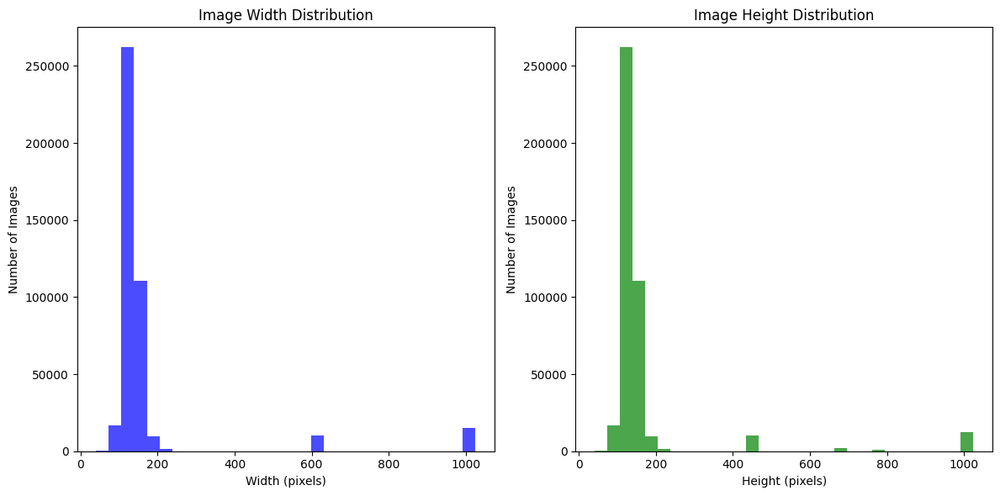

In [4]:
# make a histogram of the image sizes
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.hist(sizes_df['width'], bins=30, color='blue', alpha=0.7)
plt.title('Image Width Distribution')
plt.xlabel('Width (pixels)')
plt.ylabel('Number of Images')
plt.subplot(1, 2, 2)
plt.hist(sizes_df['height'], bins=30, color='green', alpha=0.7)
plt.title('Image Height Distribution')
plt.xlabel('Height (pixels)')
plt.ylabel('Number of Images')
plt.tight_layout()
plt.show()

## Color distribution
We analyze the color distribution of the images in both datasets for each color channel (Red, Green, Blue).
This is needed to normalize the images in the augmentation transformations.

In [6]:
# Calculate mean and std for each channel in batched manner
import numpy as np
from PIL import Image
from tqdm import tqdm
def calculate_mean_std(image_paths, batch_size=100):
    n_images = len(image_paths)
    mean = np.zeros(3)
    std = np.zeros(3)
    
    def load_and_process_batch(batch_paths):
        batch_images = []
        for p in batch_paths:
            try:
                img = Image.open(p).resize((448, 448))
                img_array = np.array(img) / 255.0
                batch_images.append(img_array)
            except Exception:
                pass  # Skip corrupted images
        if batch_images:
            batch_images = np.stack(batch_images, axis=0)
            batch_mean = batch_images.mean(axis=(0, 1, 2))
            batch_std = batch_images.std(axis=(0, 1, 2))
            return batch_mean * len(batch_images), batch_std * len(batch_images), len(batch_images)
        return np.zeros(3), np.zeros(3), 0
    
    with ThreadPoolExecutor(max_workers=4) as executor:
        futures = []
        for i in range(0, n_images, batch_size):
            batch_paths = image_paths[i:i+batch_size]
            futures.append(executor.submit(load_and_process_batch, batch_paths))
        
        for future in tqdm(as_completed(futures), total=len(futures), desc="Processing batches"):
            batch_mean, batch_std, count = future.result()
            mean += batch_mean
            std += batch_std
    
    mean /= n_images
    std /= n_images
    return mean.tolist(), std.tolist()

mean, std = calculate_mean_std(all_image_paths, batch_size=100)
print(f"Calculated Mean: {mean}")
print(f"Calculated Std: {std}")

Processing batches: 100%|██████████| 4264/4264 [1:34:40<00:00,  1.33s/it]

Calculated Mean: [0.6964884045075146, 0.522317173848262, 0.4258117795193335]
Calculated Std: [0.14229023923284076, 0.1352456532466311, 0.1283175017485678]
